# Scraper to a Letterboxd Ego Network

In this notebook, we will guide you through the process of scraping and mapping a social network from Letterboxd, a popular social media platform for film enthusiasts. We'll cover the background and requirements, step-by-step instructions for mapping the social network, and finally, we'll present the results of our analysis.


## What is Letterboxd? 
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/9/93/Letterboxd_2018_logo_%28vertical%29.svg/1200px-Letterboxd_2018_logo_%28vertical%29.svg.png" alt="Letterboxd Logo" style="width: 20%;">

Letterboxd is a global social network for grass-roots film discussion and discovery, a service for sharing film reviews and lists. Used as a diary to record and share your opinion about films as you watch them, or just to keep track of films you’ve seen in the past. In this project, we aim to map the social network of Letterboxd users by scraping follower and following relationships.

### Tools and Libraries

To achieve this, we will use the following tools and libraries, among others:
- **Python**: The main programming language used for this project.
- **Requests**: For sending HTTP requests to fetch web pages.
- **BeautifulSoup**: For parsing HTML and extracting data.
- **NetworkX**: For creating and analyzing the social network graph.
- **Matplotlib**: For visualizing the network.

You can find the complete list of required libraries and install them using the requirements file available on GitHub: [requirements.txt](https://github.com/juanjuanjuanfer/SNA-of-Letterboxd/blob/main/requirements.txt).


### Limitations

There are a few limitations to consider:
- **Rate Limiting**: Letterboxd may limit the number of requests we can send in a given time period. Try not to scrap various accounts in a short period of time. 
- **Data Privacy**: Ensure that the data collection respects the privacy policies of Letterboxd and the users.
- **Incomplete Data**: We might not be able to scrape all connections due to account privacy settings or rate limiting.

If you prefer not to scrape data, you can use the example JSON file provided: [example_network.json](https://github.com/juanjuanjuanfer/SNA-of-Letterboxd/blob/main/example_network.json).

## Mapping an Ego Network

### What is an Ego Network?

Ego Networks are a particular type of network which specifically maps the connections of and from the perspective of a single person (an “ego”) and the individuals they are directly connected to (their "alters"). [1](https://bookdown.org/omarlizardo/_main/2-10-ego-centric-networks.html)
In Ego Networks strong ties are homophilous. That is, people have the strongest ties with people who similar to themselves on key attributes, such as social class, age, sex, race, political views, etc.
#### Why Study Ego Networks?

**Reason 1: Individuals are Interesting!**

In today’s hyper-connected workspace, organizations are constantly trying to enhance the Social Capital of their employees by identifying issues or opportunities that arise from the constraints or benefits of the networks around them. There are multiple direct applications of Ego Network Analysis:

- **Leadership Development**: Identify how well leaders are positioned to leverage their networks as support mechanisms, information pathways, and innovation channels.
- **High Potential Programs**: Use the Ego Network of potential high-potential employees to quantify how effectively they are cultivating their relationships and developing themselves as leaders.
- **Social Capital**: The Ego Network of every employee can provide a wealth of information on areas of improvement such as the quality and quantity of connections, diversity of relationships, and the level of support provided by colleagues.

**Reason 2: Complete Networks Get Very Large, Very Quickly!**

If we were to do an Organizational Network Analysis (ONA) of a midsize organization with 5000 people, assuming each person has 15 immediate links (i.e., First Degree connections), that results in a network with a minimum of 75,000 connections! This number increases significantly when considering Second and Third Degree connections (i.e., friends of friends). 

### Step-by-Step Guide Summary

1. **Setting Up the Environment**
    - Install the required libraries.
    - Import the necessary modules.

2. **Fetching Data from Letterboxd**
    - Define the target user (ego) whose network we want to map.
    - Send requests to the Letterboxd website to retrieve the list of followers and followings.
    - Parse the HTML content to extract user data.

3. **Creating the Network Graph**
    - Initialize a graph using NetworkX.
    - Add nodes and edges to represent the ego and their connections.
    - Optionally, fetch additional data for each alter to enrich the network.

4. **Analyzing the Network**
    - Calculate basic network metrics (e.g., degree, centrality).
    - Identify key influencers or hubs within the network.

5. **Visualizing the Network**
    - Plot the network graph using Matplotlib.
    - Customize the visualization for better clarity and presentation.

## Results

### Visualizations

We include visualizations of the network graph that will help illustrate your results. For the visualization, we are using a library that generates an HTML file to interact with the graph. This method was chosen because it provides the best option for the information to be readable. Further in the file, we will explain how to open it, but basically, you just need to drag the file to your browser.



In [6]:
import re
import requests
import json

def get_user_data(user):
    attempt = requests.get(f"https://letterboxd.com/{user}")
    if attempt.status_code != 200:
        print(f"User {user} not found.")
        return [], []

    followingurl = f"https://letterboxd.com/{user}/following"
    followersurl = f"https://letterboxd.com/{user}/followers"

    def extract_following(user, mainurl, n=1, follow=[]):
        response = requests.get(mainurl).text
        pattern = r'<a\s+href="\/[a-z0-9_]+\/"\s+class="name">'
        matches = re.findall(pattern, response)
        following = [re.search(r'<a\s+href="\/([a-z0-9_]+)\/"\s+class="name">', x) for x in matches]
        following = [x.group(1) for x in following if x]
        follow.extend(following)

        if re.findall(f'<a class="next" href="/{user}/following/page/{n+1}/">Next</a>', response):
            newmainurl = f"https://letterboxd.com/{user}/following/page/{n+1}/"
            extract_following(user, newmainurl, n+1, follow)
        return follow

    following = extract_following(user, followingurl)
    followers = extract_following(user, followersurl)
    return following, followers

def scrape_network(user, depth=2):
    to_scrape = {user}
    scraped = set()
    network = {user: {"following": [], "followers": []}}

    for _ in range(depth):
        next_to_scrape = set()
        for usr in to_scrape:
            if usr not in scraped:
                following, followers = get_user_data(usr)
                if usr not in network:
                    network[usr] = {"following": [], "followers": []}
                network[usr]["following"] = following
                network[usr]["followers"] = followers
                next_to_scrape.update(following)
                next_to_scrape.update(followers)
                scraped.add(usr)
        to_scrape = next_to_scrape

    return network

user = input("Enter the user you want to extract the following and followers from: ")
network = scrape_network(user)

with open(f"{user}_network.json", "w") as f:
    json.dump(network, f, indent=4)

In [22]:
import json
import matplotlib.pyplot as plt
import networkx as nx

# Load the network data
with open("fer_nwn_network.json", "r") as f:
    network = json.load(f)

# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges
for usr, data in network.items():
    G.add_node(usr)
    for following in data["following"]:
        G.add_edge(usr, following)
    for follower in data["followers"]:
        G.add_edge(follower, usr)

# Draw the graph
plt.figure(figsize=(50, 50),dpi=200)
pos = nx.spring_layout(G, k=0.1)

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.5, arrows=True, arrowstyle='-')

# Draw labels only (no nodes)
nx.draw_networkx_labels(G, pos, font_size=8, font_color='black')

# Set the title and show the plot
plt.title("Social Network Graph", fontsize=15)
plt.show()


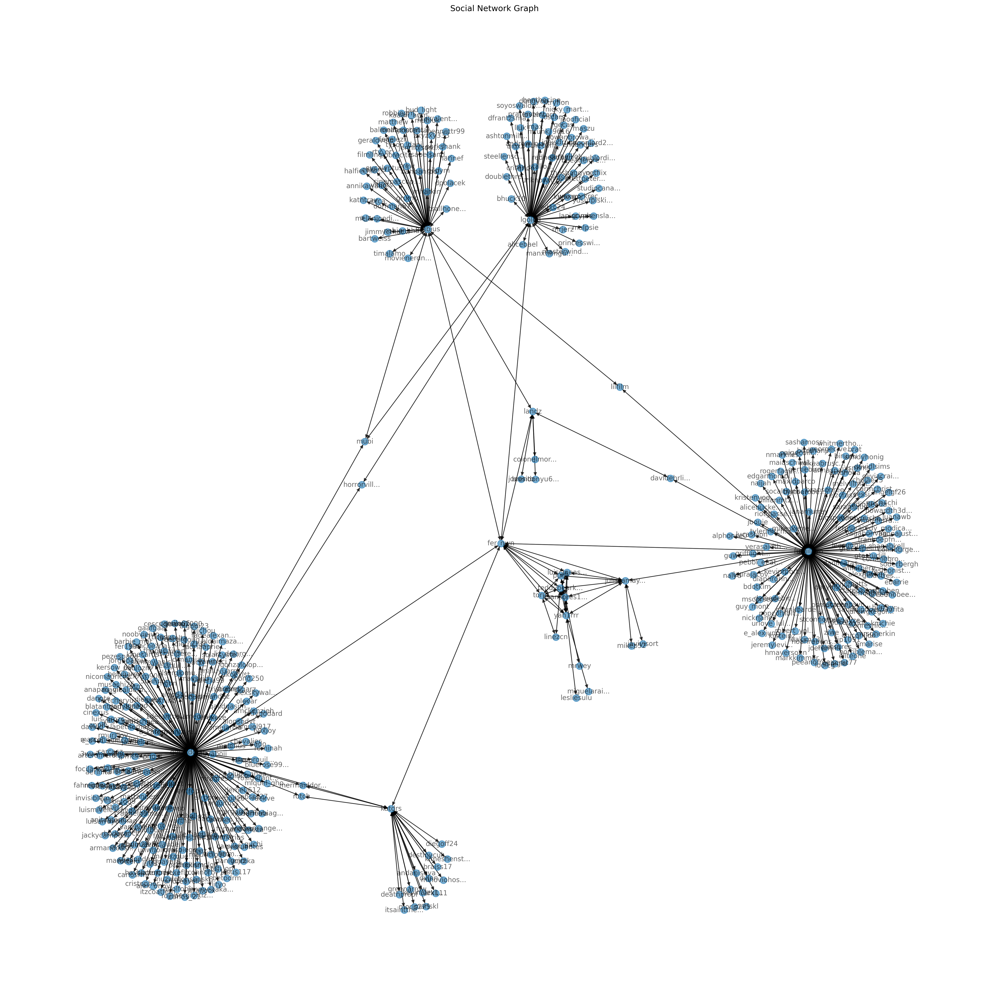

In [6]:
import json
import matplotlib.pyplot as plt
import networkx as nx

# Load the network data
with open("fer_nwn_network.json", "r") as f:
    network = json.load(f)

# Create a directed graph
G = nx.DiGraph()

# Add nodes and edges
for user, data in network.items():
    G.add_node(user)
    for following in data["following"]:
        G.add_edge(user, following)
    for follower in data["followers"]:
        G.add_edge(follower, user)

# Shorten long node labels for better readability
def shorten_label(label, max_length=10):
    return label if len(label) <= max_length else label[:max_length] + "..."

shortened_labels = {node: shorten_label(node) for node in G.nodes()}

# Draw the graph
plt.figure(figsize=(20, 20), dpi=300)  # Increase figure size and resolution
pos = nx.spring_layout(G, k=0.1)
nx.draw(G, pos, labels=shortened_labels, with_labels=True, node_size=100, font_size=10, alpha=0.6, arrows=True)
plt.title("Social Network Graph")
plt.show()


In [24]:
import json
from pyvis.network import Network
from collections import defaultdict

# Load the network data
with open("fer_nwn_network.json", "r") as f:
    network = json.load(f)

# Create a pyvis network
net = Network(notebook=True, directed=True, height="750px", width="100%", bgcolor="#111111", font_color="white")

# Collect all unique nodes
all_nodes = set(network.keys())
for data in network.values():
    all_nodes.update(data["following"])
    all_nodes.update(data["followers"])

# Add all nodes to the network
for node in all_nodes:
    net.add_node(node, label=node, color="#2C916B", size=20, shape='text') #net.add_node(node, label=node, color='#2C916B', shape='circularImage', image='url_to_image')


# Add edges to the network with a limit of 2 edges between any two nodes
edge_count = defaultdict(lambda: defaultdict(int))


for usr, data in network.items():
    if usr in all_nodes:
        for following in data["following"]:
            if following in all_nodes:
                if edge_count[usr][following] < 1:
                    net.add_edge(usr, following, color= "#D4D4D4", alpha=0.5, arrows=None)
                    edge_count[usr][following] += 1

# Show the graph
net.show(f"{user}_ego_network_graph.html")


fer_nwn_ego_network_graph.html


In [4]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create the graph
G = nx.DiGraph()

# Add nodes and edges
for user, data in network.items():
    G.add_node(user)
    for following in data["following"]:
        G.add_edge(user, following)
    for follower in data["followers"]:
        G.add_edge(follower, user)

# 3D graph using Plotly
pos = nx.spring_layout(G, dim=3)

x_nodes = [pos[node][0] for node in G.nodes]
y_nodes = [pos[node][1] for node in G.nodes]
z_nodes = [pos[node][2] for node in G.nodes]

edge_x = []
edge_y = []
edge_z = []
for edge in G.edges:
    x0, y0, z0 = pos[edge[0]]
    x1, y1, z1 = pos[edge[1]]
    edge_x.extend([x0, x1, None])
    edge_y.extend([y0, y1, None])
    edge_z.extend([z0, z1, None])

trace_nodes = go.Scatter3d(
    x=x_nodes,
    y=y_nodes,
    z=z_nodes,
    mode='markers',
    marker=dict(size=5, color='blue'),
    text=list(G.nodes)
)

trace_edges = go.Scatter3d(
    x=edge_x,
    y=edge_y,
    z=edge_z,
    mode='lines',
    line=dict(color='black', width=0.5),
    hoverinfo='none'
)

fig = go.Figure(data=[trace_edges, trace_nodes])

fig.update_layout(
    title='3D Network Graph',
    showlegend=False,
    scene=dict(
        xaxis=dict(showbackground=False),
        yaxis=dict(showbackground=False),
        zaxis=dict(showbackground=False)
    )
)

fig.show()

In [39]:
import json
from pyvis.network import Network
from collections import defaultdict
from bs4 import BeautifulSoup


# Load the network data
with open("fer_nwn_network.json", "r") as f:
    network = json.load(f)

# Create a pyvis network
net = Network(notebook=True, directed=True, height="750px", width="100%", bgcolor="#111111", font_color="white")

# Collect all unique nodes
all_nodes = set(network.keys())
for data in network.values():
    all_nodes.update(data["following"])
    all_nodes.update(data["followers"])

# Add all nodes to the network
for node in all_nodes:
    profile_link = f"https://letterboxd.com/{node}/"
    #print(profile_link)
    response = requests.get(profile_link)
    html = response.text

    # Parse the HTML with BeautifulSoup
    soup = BeautifulSoup(html, 'html.parser')

    # Find the div with the class 'profile-avatar' and then the img within it
    div = soup.find('div', class_='profile-avatar')
    if div:
        img = div.find('img')
        if img and 'src' in img.attrs:
            profile_image_link = img['src']
            net.add_node(node, label=node, color='#2C916B', shape='circularImage', image=profile_image_link)
    #net.add_node(node, label=node, color='#2C916B', shape='circularImage', image='url_to_image')
#<img src="https://a.ltrbxd.com/resized/avatar/upload/6/9/4/5/7/0/0/shard/avtr-0-220-0-220-crop.jpg?v=68e8833c97" alt="Fer" width="110" height="110">

# Add edges to the network with a limit of 2 edges between any two nodes
edge_count = defaultdict(lambda: defaultdict(int))


for usr, data in network.items():
    if usr in all_nodes:
        for following in data["following"]:
            if following in all_nodes:
                if edge_count[usr][following] < 1:
                    net.add_edge(usr, following, color= "#D4D4D4", alpha=0.5, arrows=None)
                    edge_count[usr][following] += 1

# Show the graph
net.show(f"{user}_ego_network_graph_withimage.html")

fer_nwn_ego_network_graph_withimage.html
